In [ ]:
!pip install hopsworks pandas==2.1.4 numpy==1.26.4 matplotlib seaborn plotly scikit-learn

import pandas as pd
import numpy as np
import os

In [ ]:
from google.colab import userdata
import os

os.environ["HOPSWORKS_API_KEY"] = userdata.get('HOPSWORKS_API_KEY')

In [ ]:
from google.colab import userdata
import hopsworks

api_key = userdata.get('HOPSWORKS_API_KEY')
project = hopsworks.login(api_key_value=api_key)

fs = project.get_feature_store()
fg = fs.get_feature_group(name="karachi_raw_data_store", version=1)
existing_df = fg.read()



To ensure compatibility please install the latest bug fix release matching the minor version of your backend (4.2) by running 'pip install hopsworks==4.2.*'



Logged in to project, explore it here https://c.app.hopsworks.ai:443/p/1238195
Finished: Reading data from Hopsworks, using Hopsworks Feature Query Service (0.68s) 


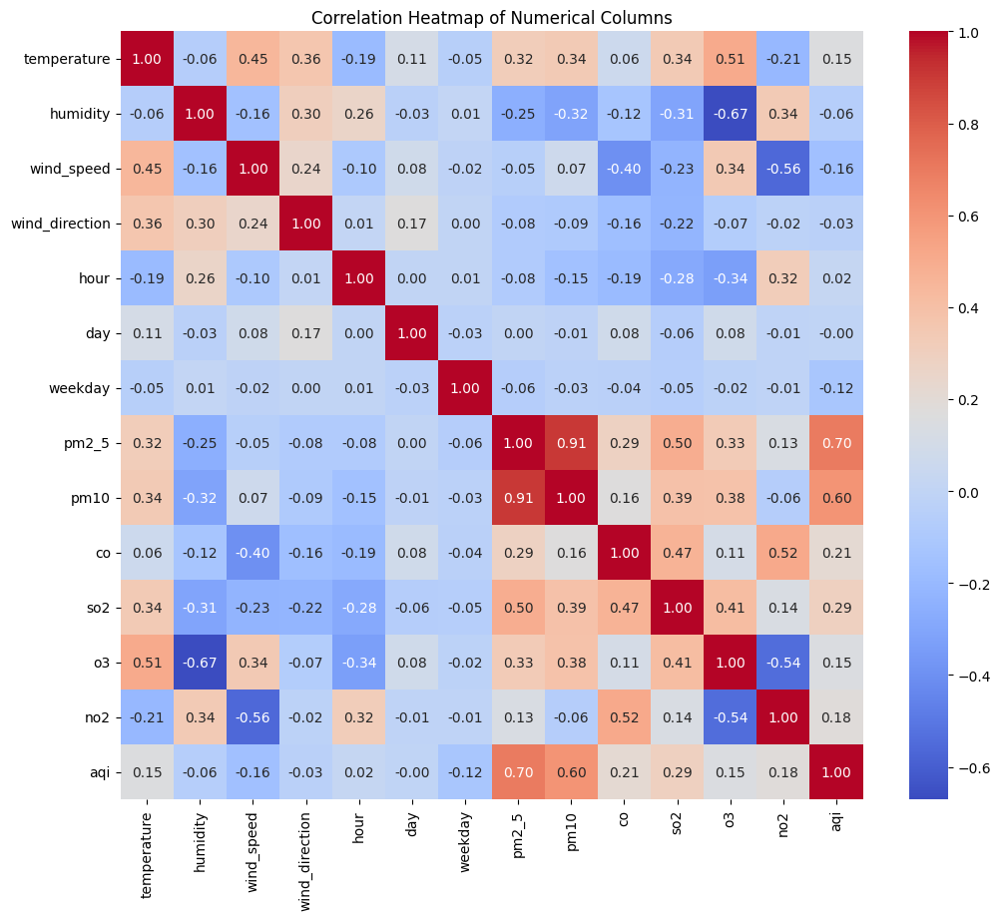

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

numerical_cols = existing_df.select_dtypes(include=np.number)

correlation_matrix = numerical_cols.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Columns')
plt.show()

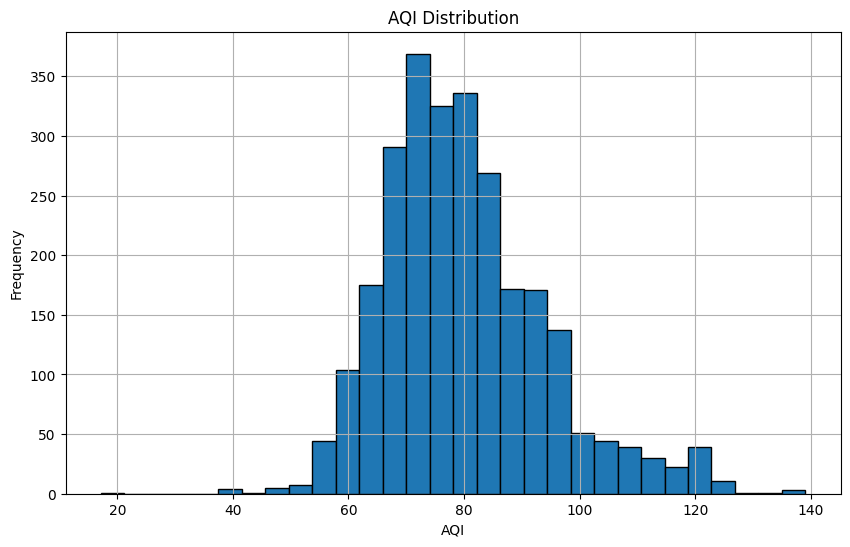

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.hist(existing_df['aqi'], bins=30, edgecolor='black')
plt.title('AQI Distribution')
plt.xlabel('AQI')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

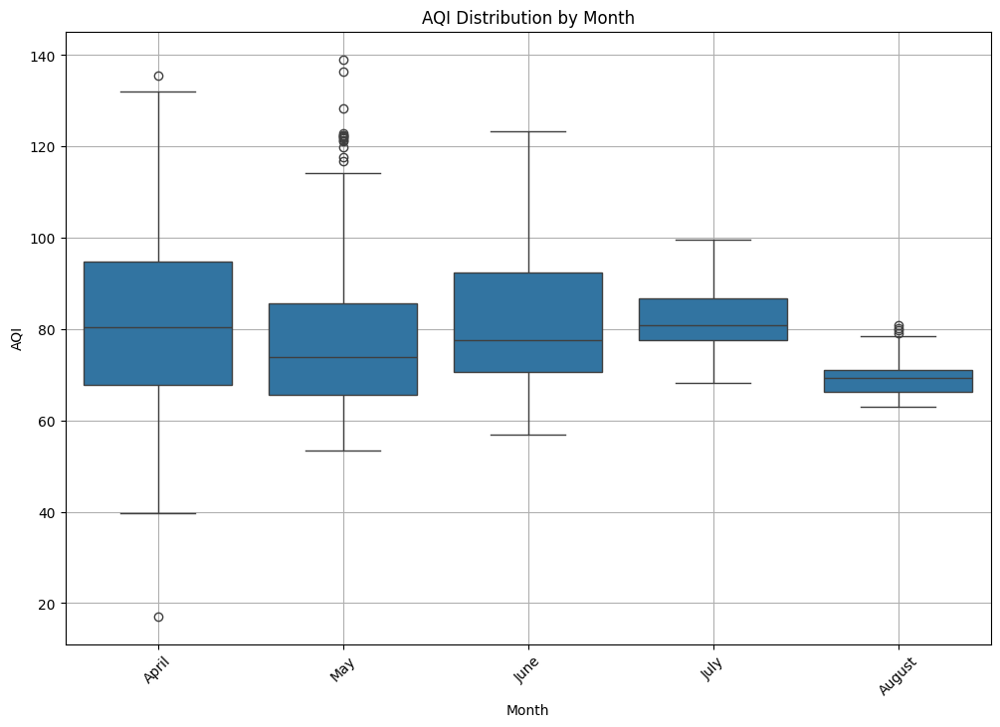

In [ ]:
import seaborn as sns

existing_df['date'] = pd.to_datetime(existing_df['date'])

existing_df['month'] = existing_df['date'].dt.month_name()

plt.figure(figsize=(12, 8))
sns.boxplot(x='month', y='aqi', data=existing_df, order=[
    'April', 'May', 'June', 'July', 'August'
])
plt.title('AQI Distribution by Month')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

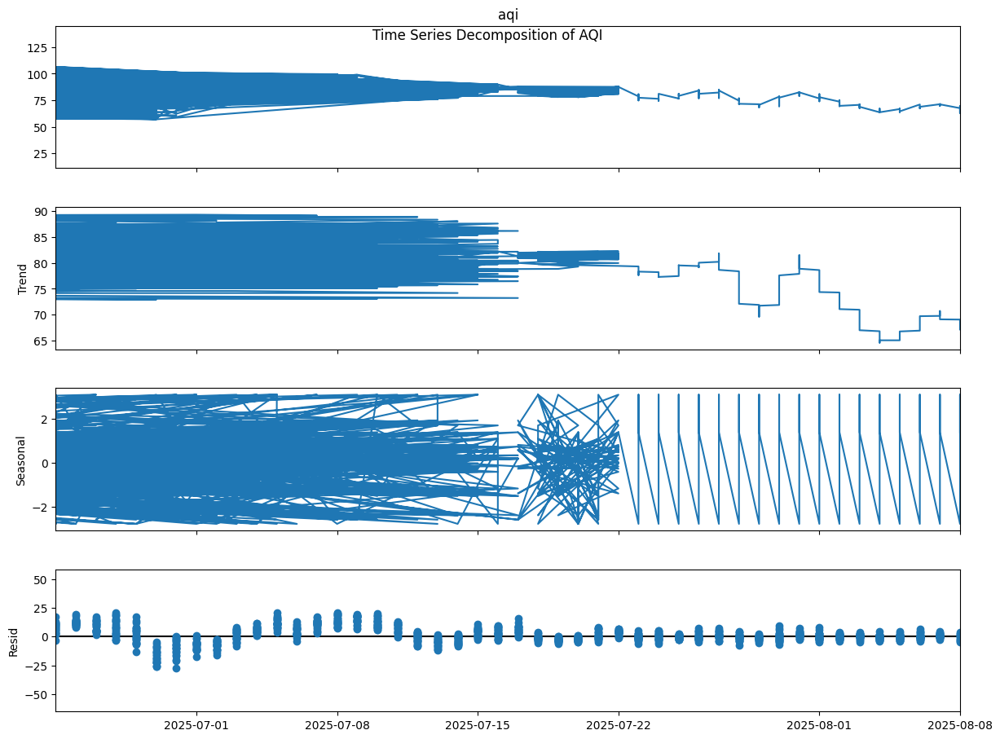

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

df_for_decomposition = existing_df.set_index('date').copy()

decomposition = seasonal_decompose(df_for_decomposition['aqi'].dropna(), model='additive', period=24)

fig = decomposition.plot()
fig.set_size_inches(14, 10)
plt.suptitle('Time Series Decomposition of AQI', y=0.92)
plt.show()

<Figure size 1400x600 with 0 Axes>

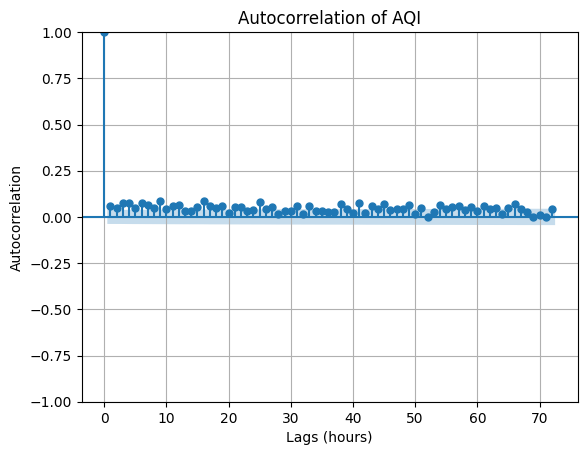

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf

# --- Autocorrelation Plot ---
plt.figure(figsize=(14, 6))
plot_acf(existing_df['aqi'].dropna(), lags=72)
plt.title('Autocorrelation of AQI')
plt.xlabel('Lags (hours)')
plt.ylabel('Autocorrelation')
plt.grid(True)
plt.show()

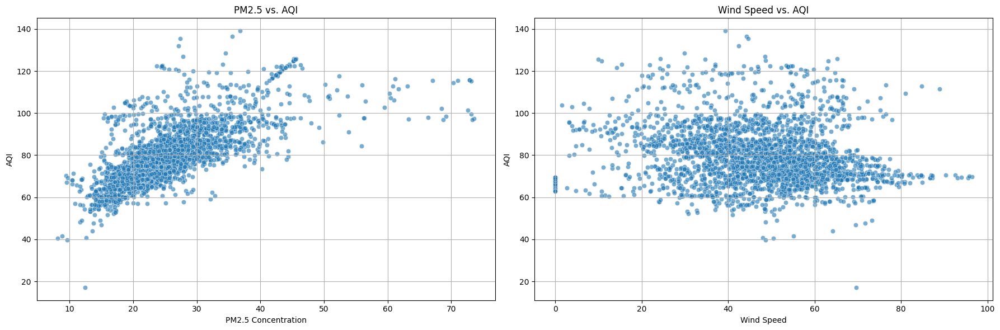

In [ ]:
# --- Feature vs. Target Scatter Plots ---
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

sns.scatterplot(ax=axes[0], x='pm2_5', y='aqi', data=existing_df, alpha=0.6)
axes[0].set_title('PM2.5 vs. AQI')
axes[0].set_xlabel('PM2.5 Concentration')
axes[0].set_ylabel('AQI')
axes[0].grid(True)

sns.scatterplot(ax=axes[1], x='wind_speed', y='aqi', data=existing_df, alpha=0.6)
axes[1].set_title('Wind Speed vs. AQI')
axes[1].set_xlabel('Wind Speed')
axes[1].set_ylabel('AQI')
axes[1].grid(True)

plt.tight_layout()
plt.show()

In [ ]:
# Now after cleaning data and a huge best selection of feaure engineering:

In [ ]:
aqi_24h_df = fs.get_feature_group('aqi_features_24h_prod', version=1).read()
aqi_48h_df = fs.get_feature_group('aqi_features_48h_prod', version=1).read()
aqi_72h_df = fs.get_feature_group('aqi_features_72h_prod', version=1).read()

print("aqi_24h_df loaded successfully.")
print("aqi_48h_df loaded successfully.")
print("aqi_72h_df loaded successfully.")

Finished: Reading data from Hopsworks, using Hopsworks Feature Query Service (0.83s) 
Finished: Reading data from Hopsworks, using Hopsworks Feature Query Service (0.58s) 
Finished: Reading data from Hopsworks, using Hopsworks Feature Query Service (0.85s) 
aqi_24h_df loaded successfully.
aqi_48h_df loaded successfully.
aqi_72h_df loaded successfully.


In [ ]:
features_24h = [
  "aqi",
  "aqi_48h",
  "no2_rolling_std_24h_lag24h",
  "aqi_lag_24h",
  "aqi_lag_72h",
  "aqi_lag_48h",
  "aqi_lag_36h",
  "so2_rolling_std_24h_lag24h",
  "co_rolling_std_24h_lag24h",
  "aqi_lag_120h"
]

features_48h = [
  "aqi_24h",
  "aqi_72h",
  "aqi_lag_144h",
  "no2_rolling_std_24h_lag48h",
  "aqi_lag_120h",
  "aqi_lag_48h",
  "aqi_lag_60h",
  "aqi_lag_96h",
  "o3_rolling_std_24h_lag48h",
  "so2_rolling_std_24h_lag48h",
  "aqi_rate_change_72h_lag48h",
  "aqi",
  "aqi_lag_72h",
  "co_rolling_std_24h_lag48h",
  "aqi_rolling_std_48h_lag48h"
]

features_72h = [
  "no2_rolling_std_24h_lag72h",
  "aqi_lag_120h",
  "co_rolling_std_24h_lag72h",
  "aqi_48h",
  "aqi_lag_96h",
  "aqi_lag_168h",
  "so2_rolling_std_24h_lag72h",
  "aqi_lag_72h"
]

target_features = ['aqi']

print("Feature and target lists defined.")

Feature and target lists defined.


In [ ]:
valid_features_24h = [col for col in features_24h if col in aqi_24h_df.columns]
print("Descriptive Statistics for 24h Prediction Horizon:")
display(aqi_24h_df[valid_features_24h].describe())

Descriptive Statistics for 24h Prediction Horizon:


,aqi,aqi_48h,no2_rolling_std_24h_lag24h,aqi_lag_24h,aqi_lag_72h,aqi_lag_48h,aqi_lag_36h,so2_rolling_std_24h_lag24h,co_rolling_std_24h_lag24h,aqi_lag_120h
count,2460.000000,2460.000000,2460.000000,2460.000000,2460.000000,2460.000000,2460.000000,2460.000000,2460.000000,2460.000000
mean,79.553055,79.348061,3.361392,79.630058,80.038933,79.777679,79.670074,1.176686,59.800378,80.842216
std,13.315434,13.271262,1.230027,13.276632,13.351489,13.228576,13.259909,0.519963,22.475799,14.252602
min,17.160494,17.160494,1.101715,17.160494,17.160494,17.160494,17.160494,0.297691,25.803452,17.160494
25%,70.573273,70.354210,2.443405,70.636803,70.941299,70.759476,70.652138,0.782522,42.804483,71.007217
50%,78.181332,77.817684,3.145477,78.225140,78.606312,78.374107,78.282101,1.047457,52.698893,78.952431
75%,86.718210,86.667826,4.022906,86.756939,87.144070,86.825552,86.762026,1.450048,76.404431,87.912981
max,139.087112,139.087112,7.891648,139.087112,139.087112,139.087112,139.087112,2.941883,134.322927,139.087112


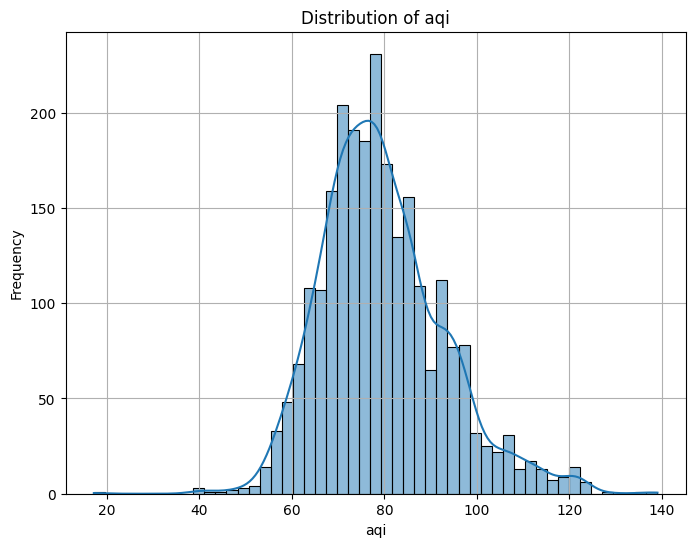

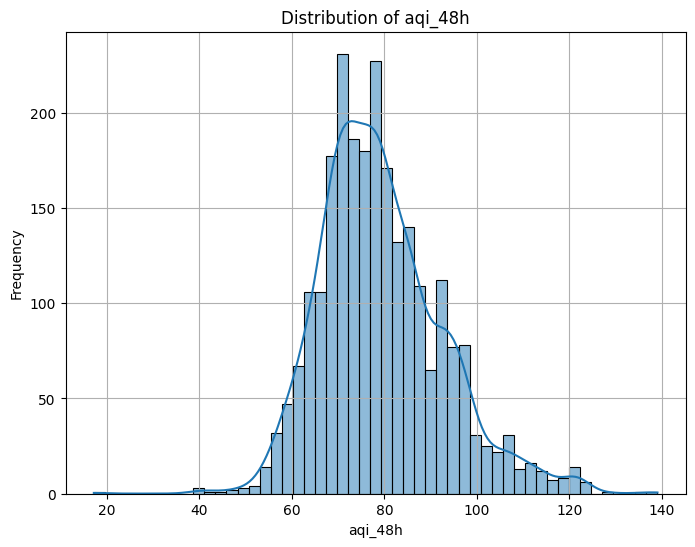

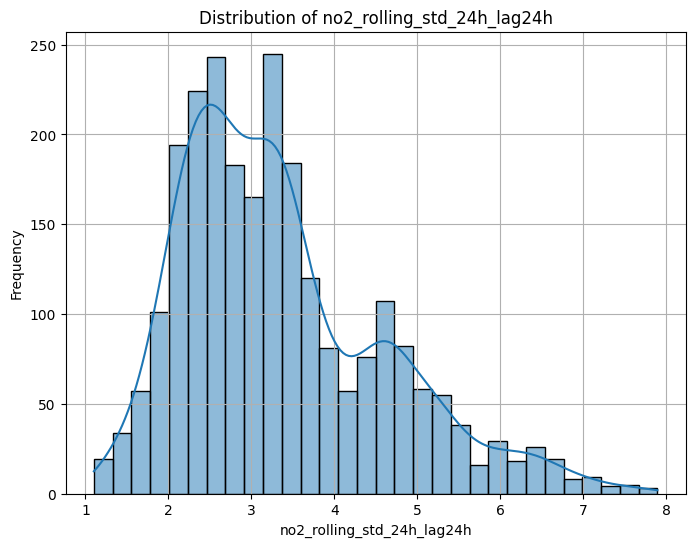

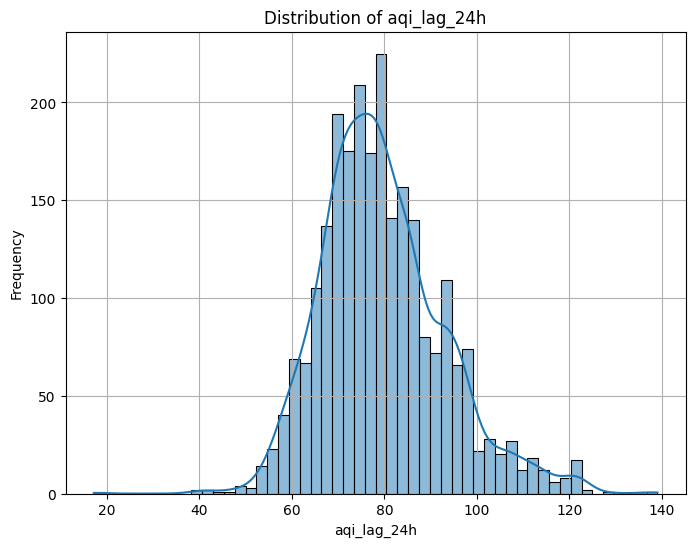

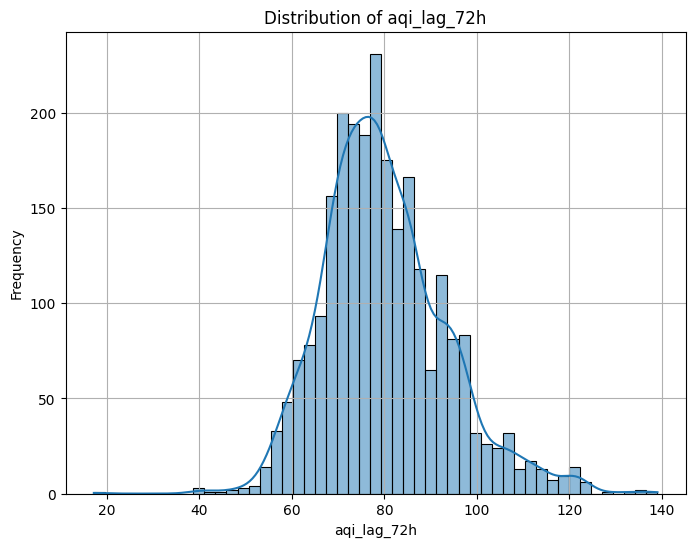

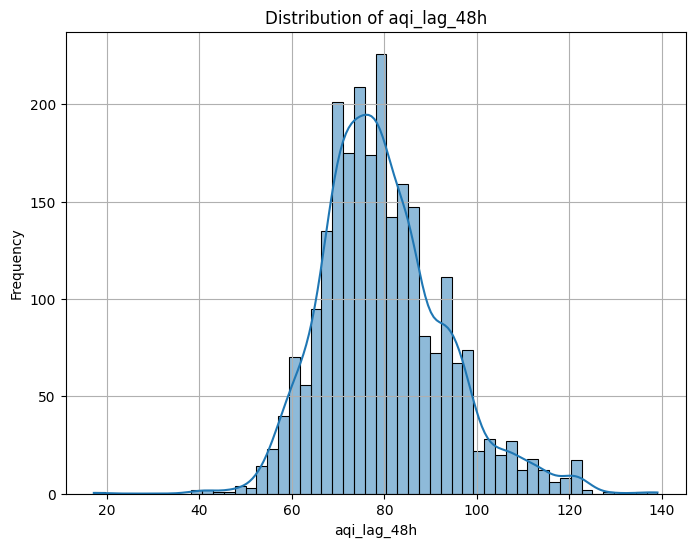

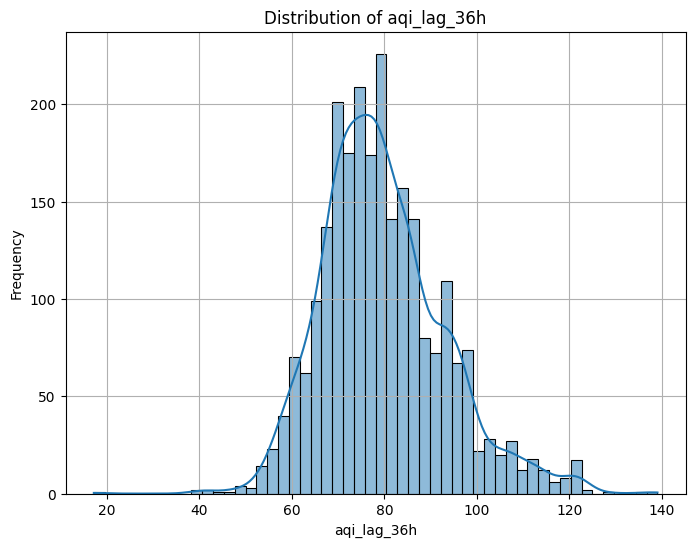

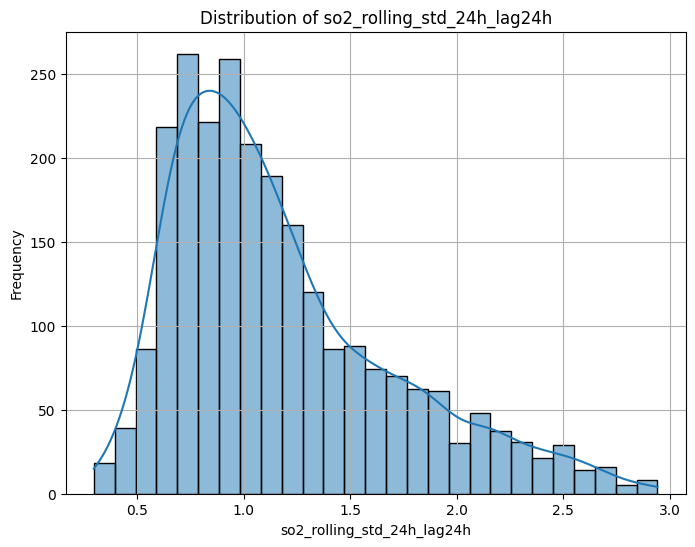

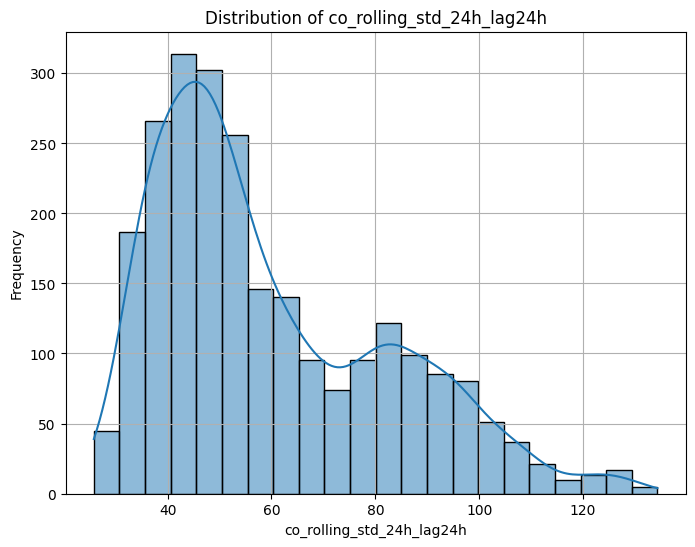

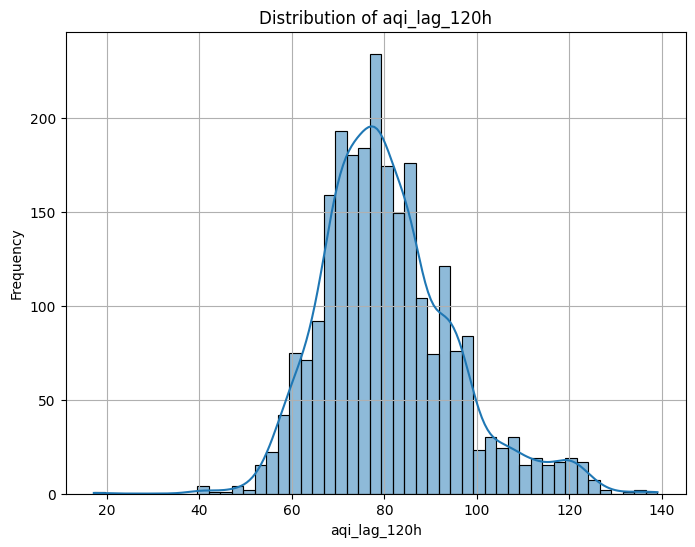

In [ ]:
for feature in valid_features_24h:
    plt.figure(figsize=(8, 6))
    sns.histplot(data=aqi_24h_df, x=feature, kde=True)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

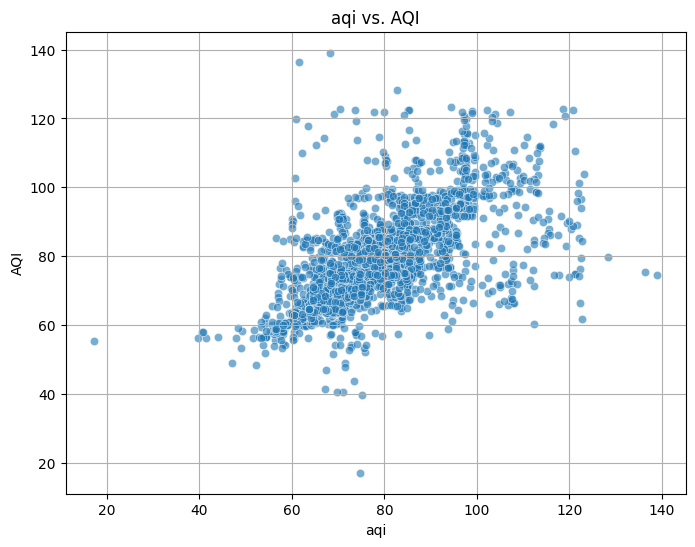

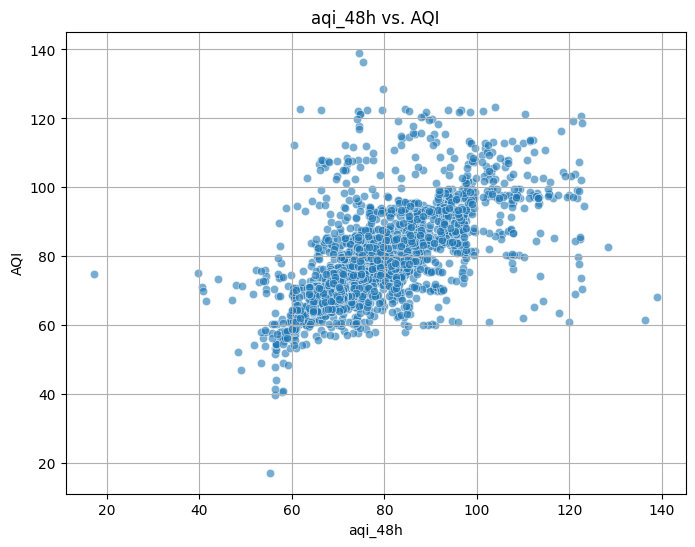

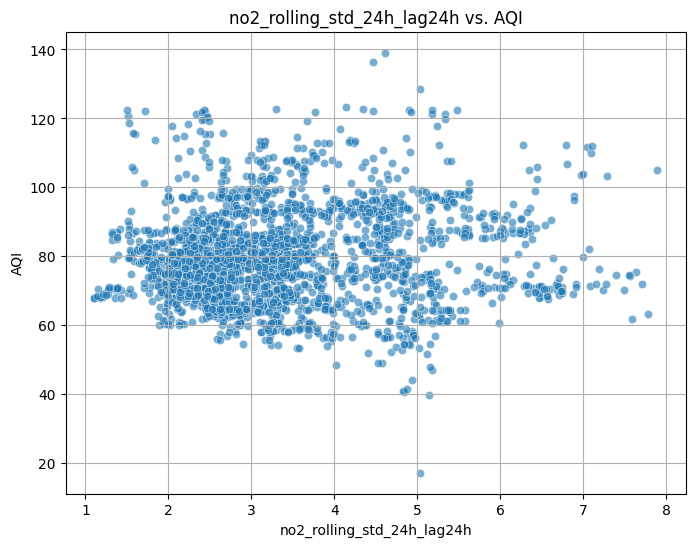

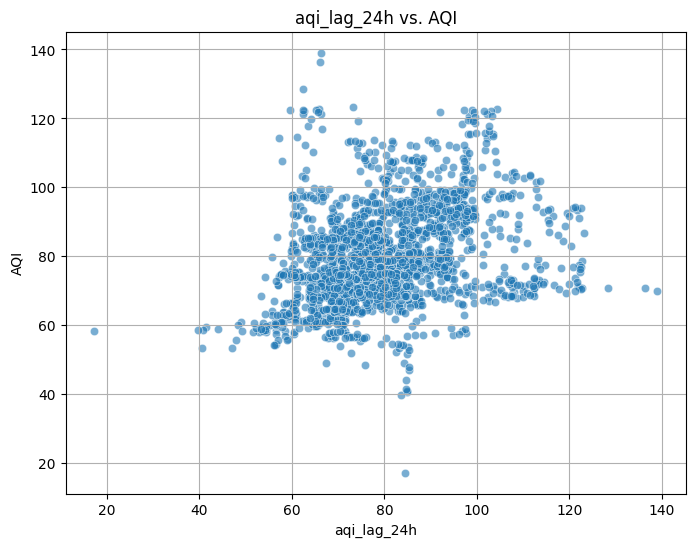

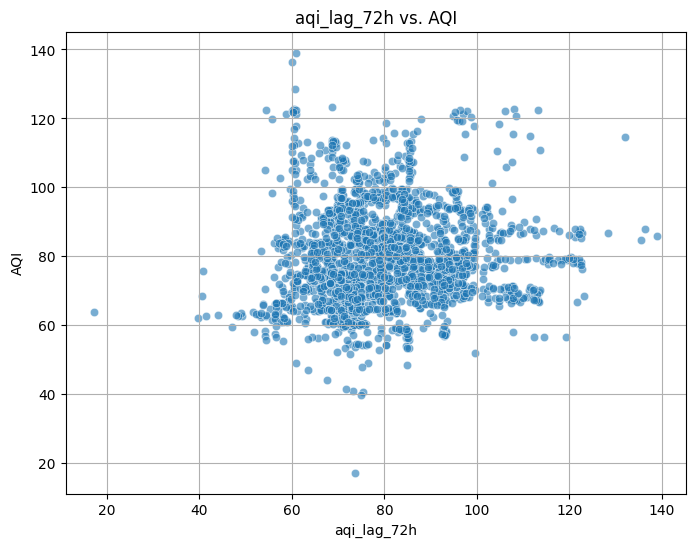

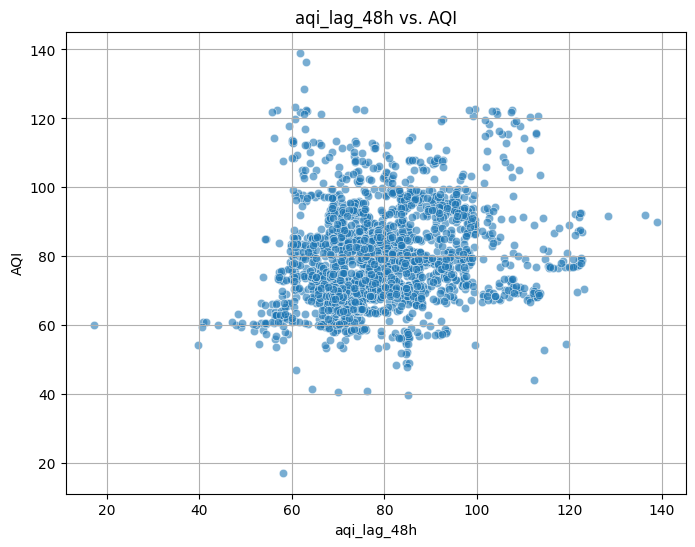

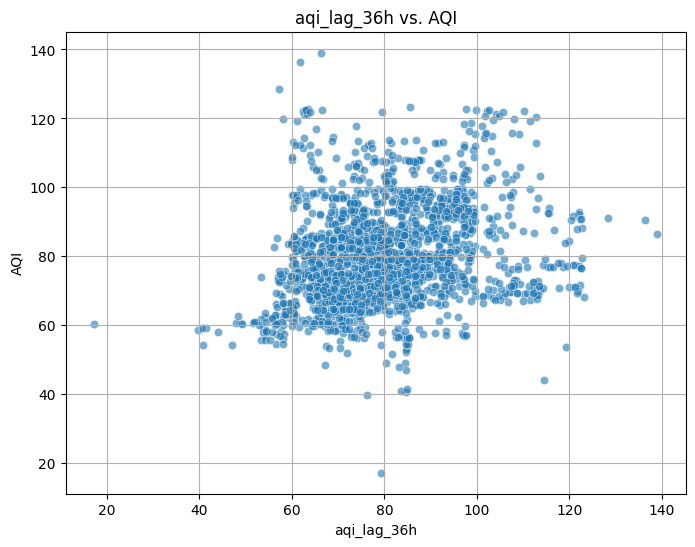

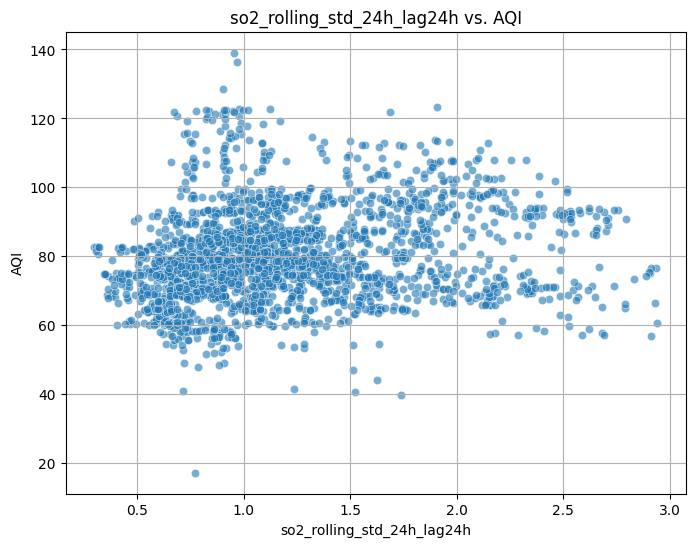

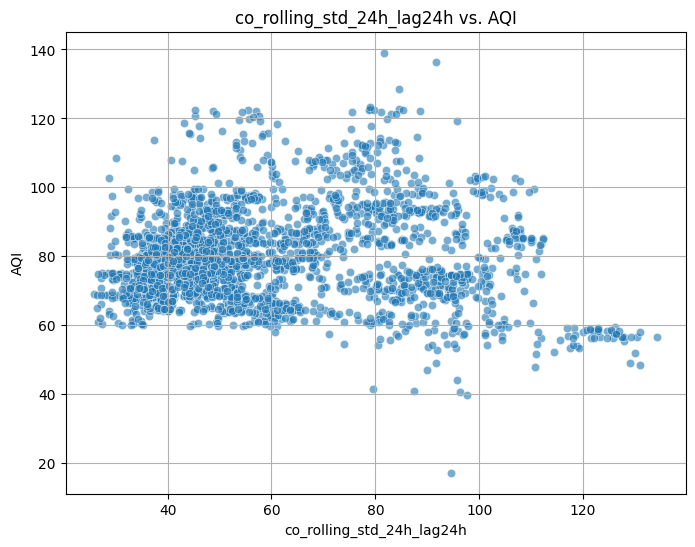

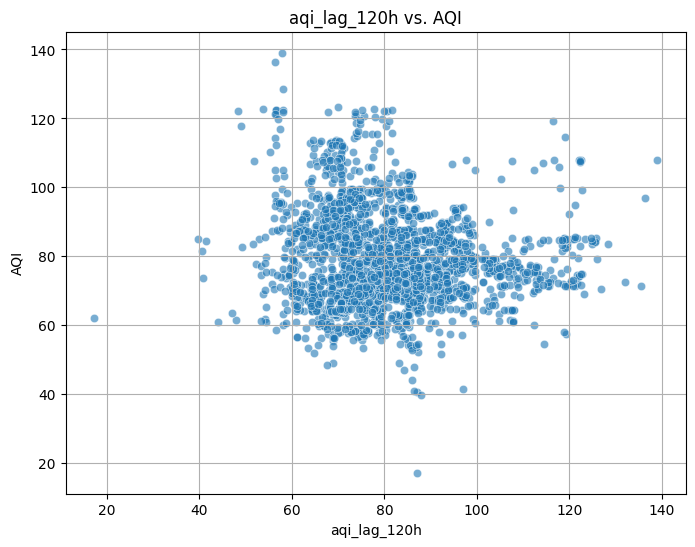

In [ ]:
for feature in valid_features_24h:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=aqi_24h_df, x=feature, y='aqi_24h', alpha=0.6)
    plt.title(f'{feature} vs. AQI')
    plt.xlabel(feature)
    plt.ylabel('AQI')
    plt.grid(True)
    plt.show()

In [ ]:
valid_features_48h = [col for col in features_48h if col in aqi_48h_df.columns]
print("Descriptive Statistics for 48h Prediction Horizon:")
display(aqi_48h_df[valid_features_48h].describe())

Descriptive Statistics for 48h Prediction Horizon:


,aqi_24h,aqi_72h,aqi_lag_144h,no2_rolling_std_24h_lag48h,aqi_lag_120h,aqi_lag_48h,aqi_lag_60h,aqi_lag_96h,o3_rolling_std_24h_lag48h,so2_rolling_std_24h_lag48h,aqi_rate_change_72h_lag48h,aqi,aqi_lag_72h,co_rolling_std_24h_lag48h,aqi_rolling_std_48h_lag48h
count,2436.000000,2436.000000,2436.000000,2436.000000,2436.000000,2436.000000,2436.000000,2436.000000,2436.000000,2436.000000,2436.000000,2436.000000,2436.000000,2436.000000,2436.000000
mean,79.432770,79.418396,80.834709,3.369258,80.466652,79.778954,79.794144,80.111122,12.108041,1.181077,-0.687697,79.601143,79.879326,59.869002,6.008780
std,13.308785,13.204932,14.322062,1.233458,13.802711,13.256012,13.263089,13.395985,4.875209,0.520617,17.574055,13.329434,13.253319,22.574620,4.458169
min,17.160494,17.160494,17.160494,1.101715,17.160494,17.160494,17.160494,17.160494,4.115402,0.297691,-68.428253,17.160494,17.160494,25.803452,0.315919
25%,70.354210,70.266586,70.932539,2.440608,70.932539,70.803291,70.818188,70.932539,8.763860,0.791225,-9.956413,70.575462,70.895300,42.697929,2.864109
50%,77.995567,77.817684,78.869186,3.151584,78.869186,78.360962,78.374107,78.680798,11.198005,1.052395,-0.812538,78.238285,78.509926,52.617708,4.385152
75%,86.756939,86.756939,88.041353,4.049744,87.627327,86.825552,86.867174,87.232071,14.997049,1.457293,9.489805,86.786125,86.945601,76.598311,8.274069
max,139.087112,139.087112,139.087112,7.891648,139.087112,139.087112,139.087112,139.087112,31.573680,2.941883,77.263649,139.087112,139.087112,134.322927,24.822214


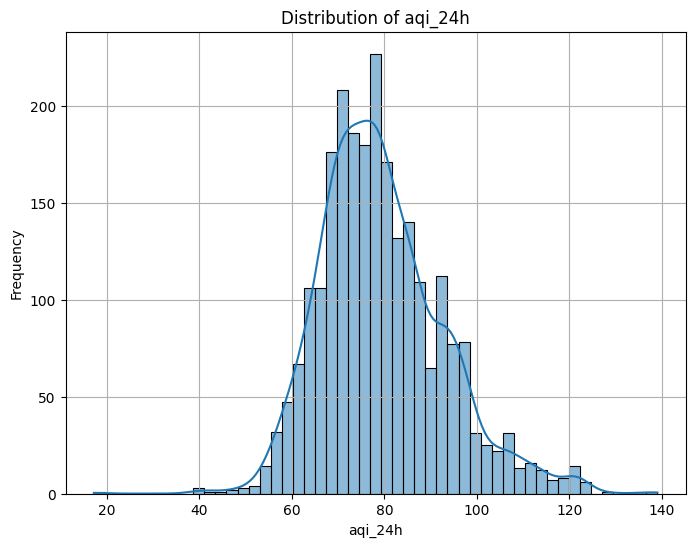

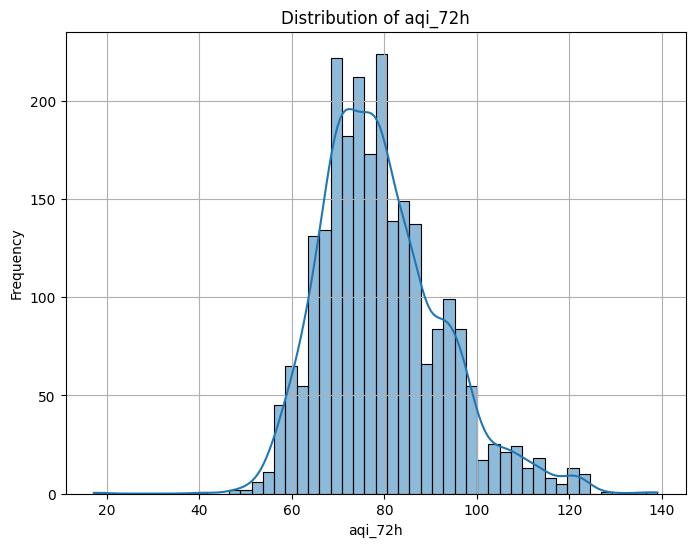

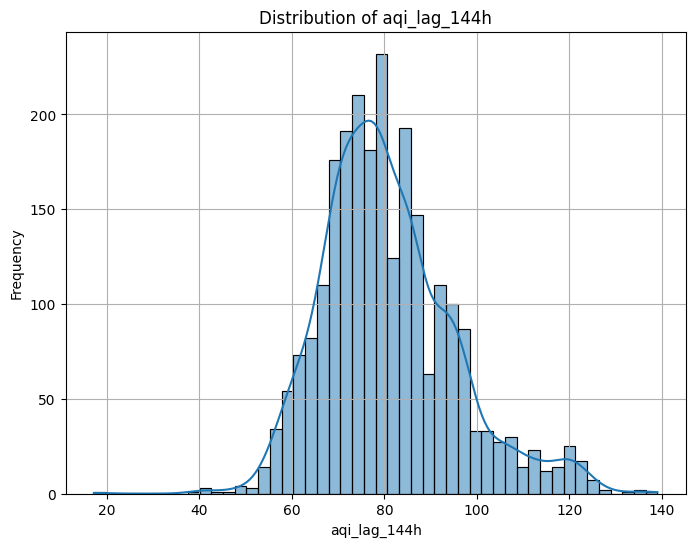

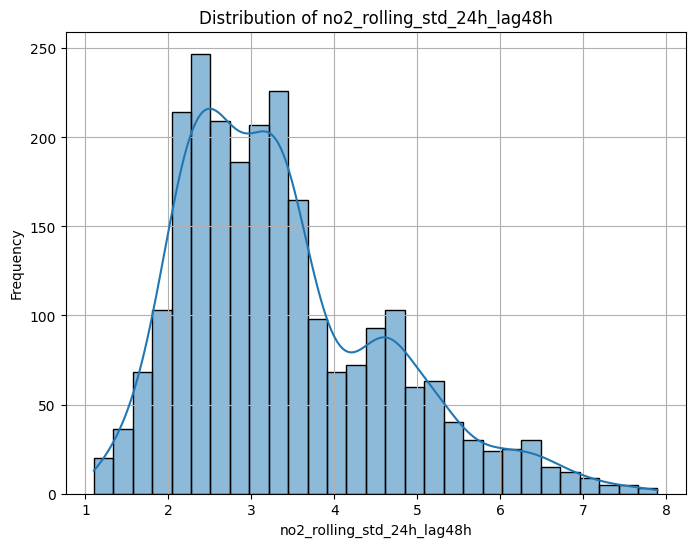

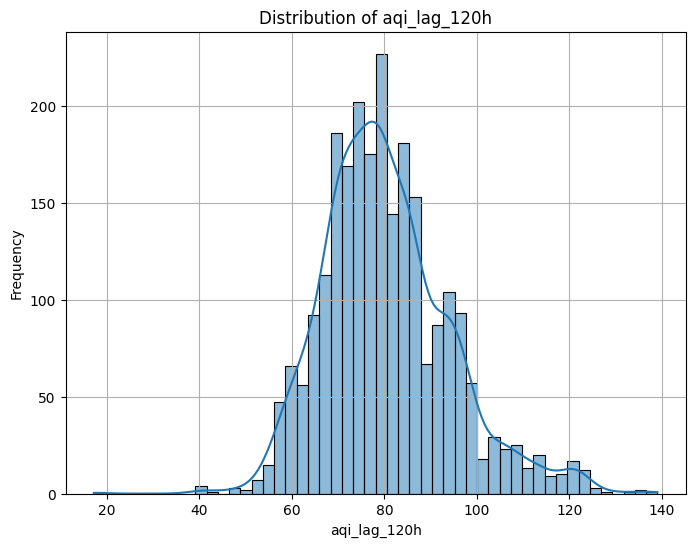

...

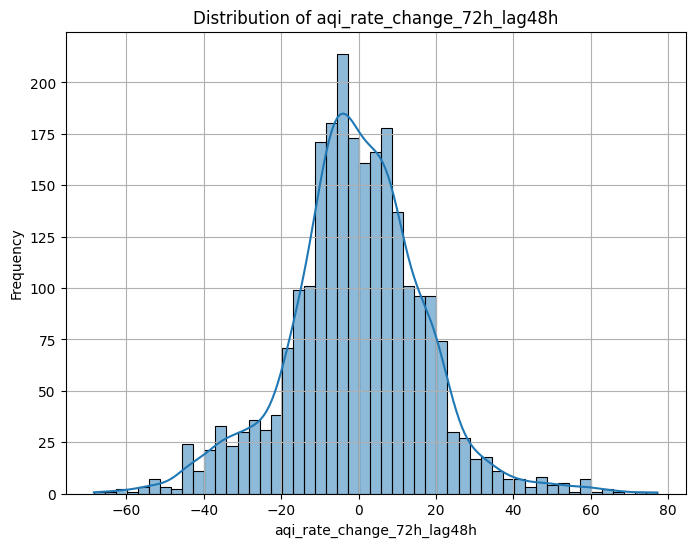

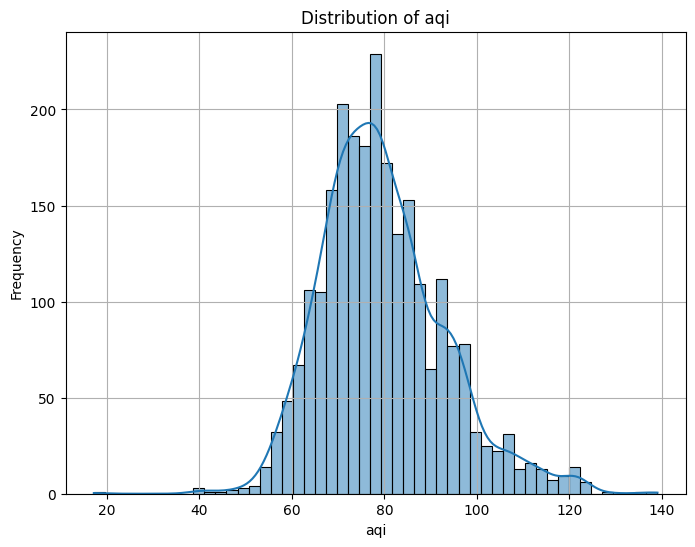

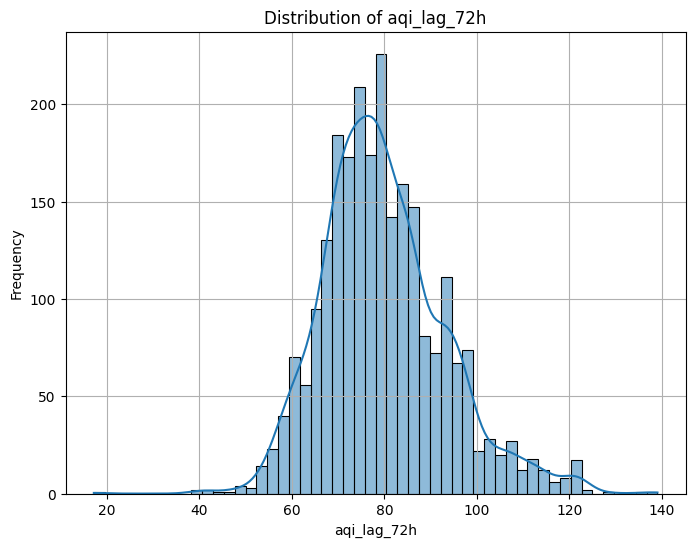

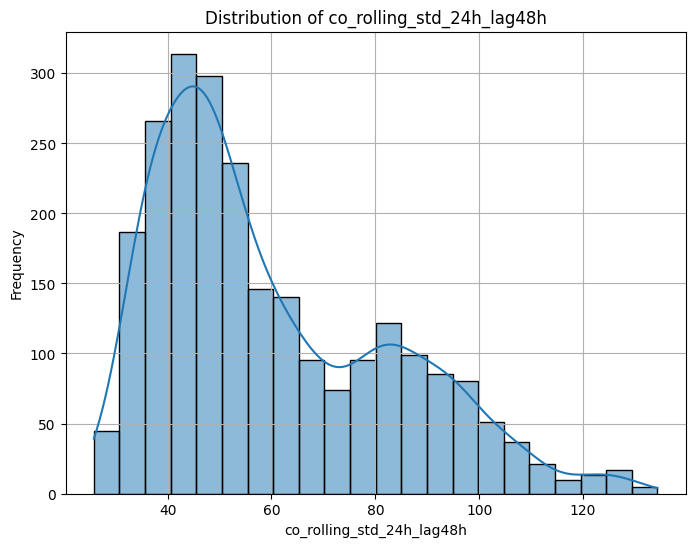

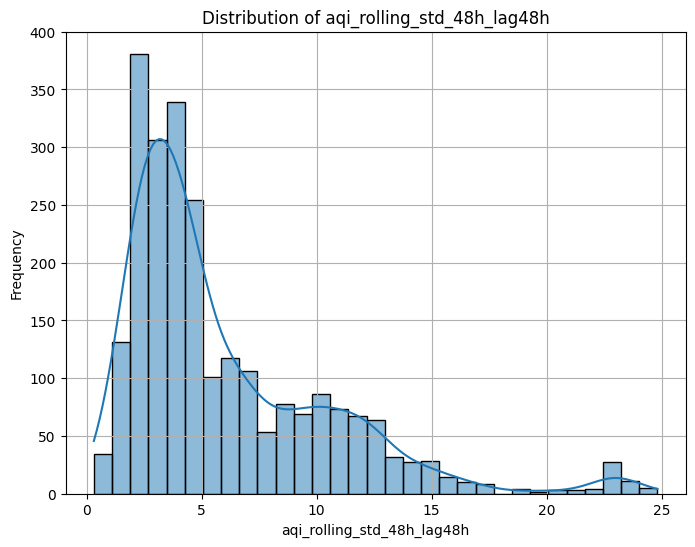

In [ ]:
for feature in valid_features_48h:
    plt.figure(figsize=(8, 6))
    sns.histplot(data=aqi_48h_df, x=feature, kde=True)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

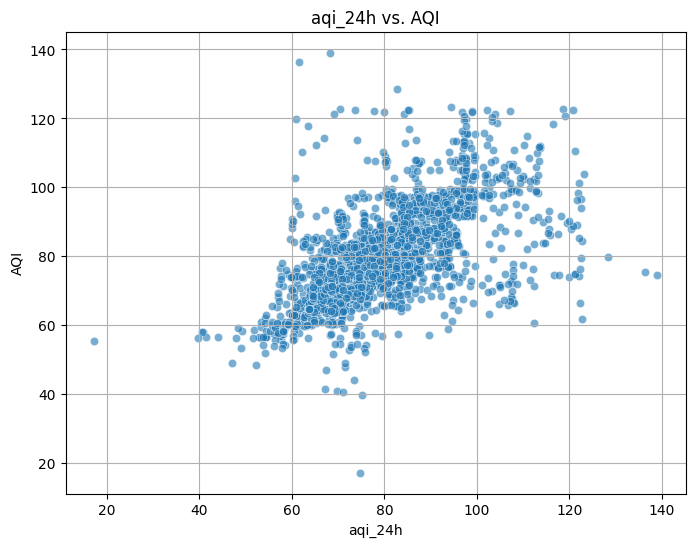

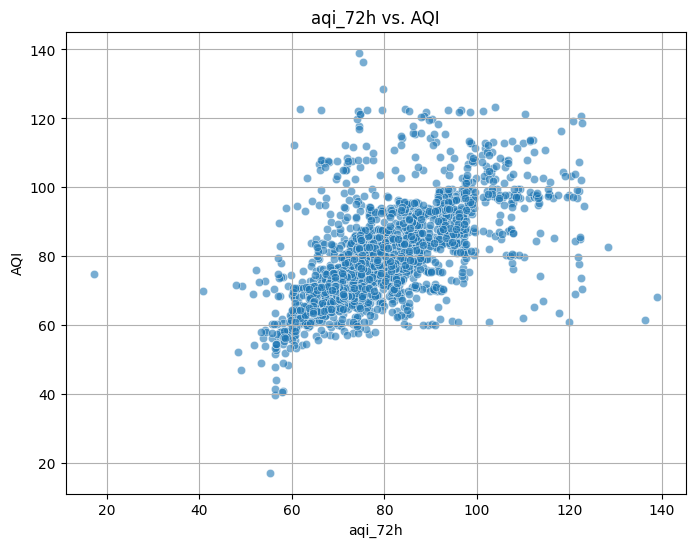

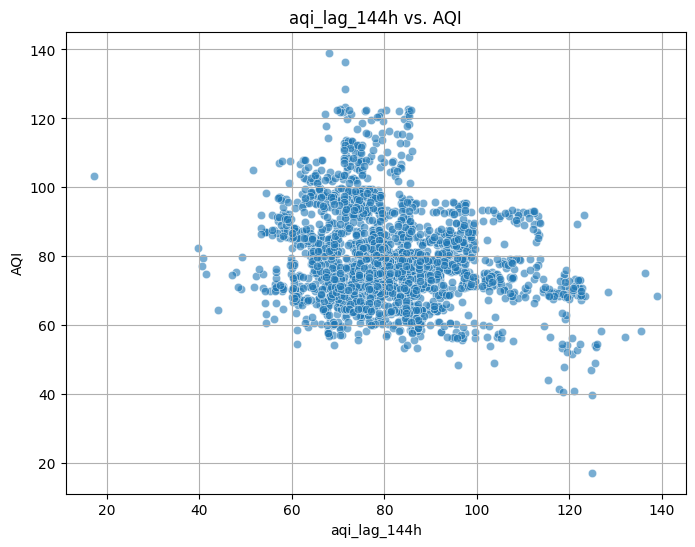

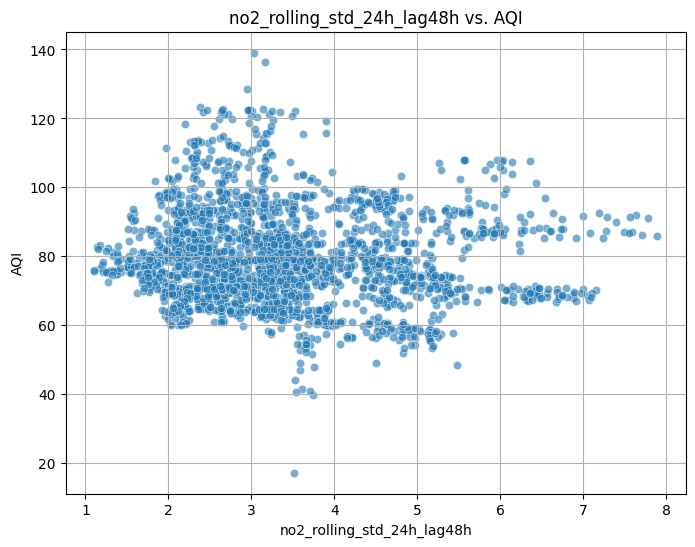

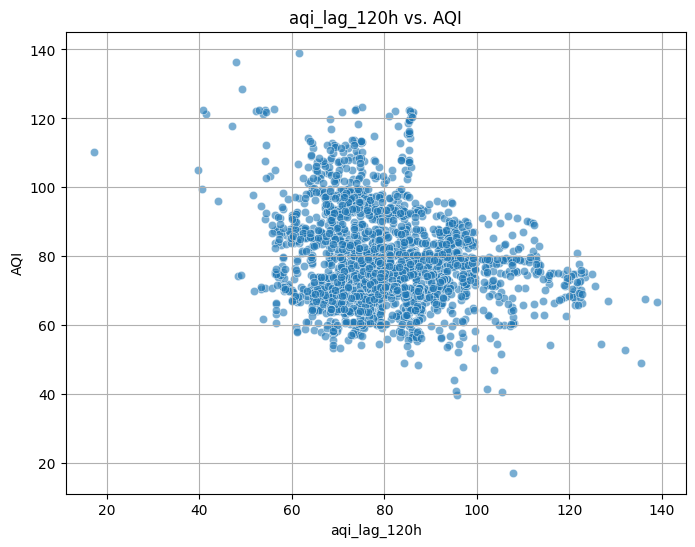

...

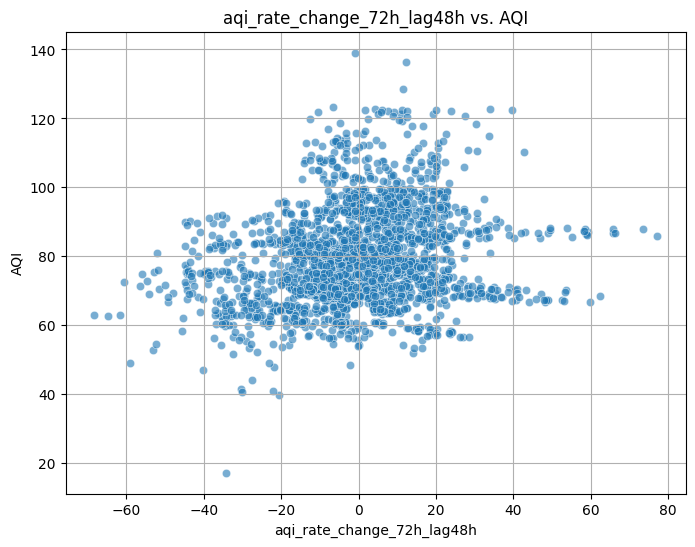

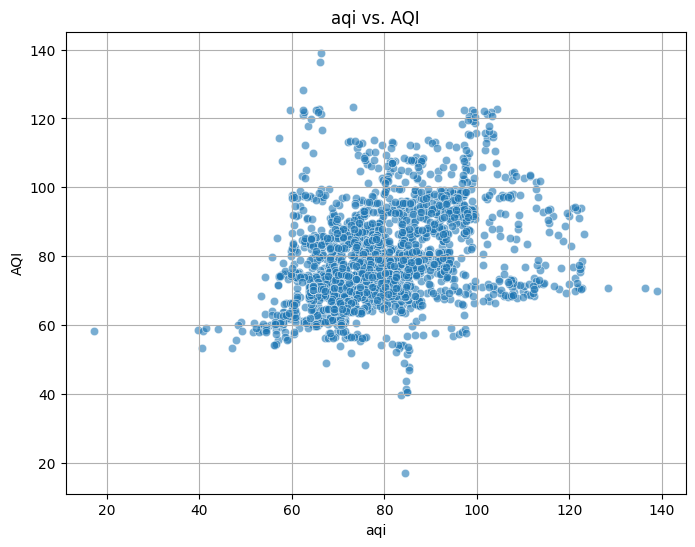

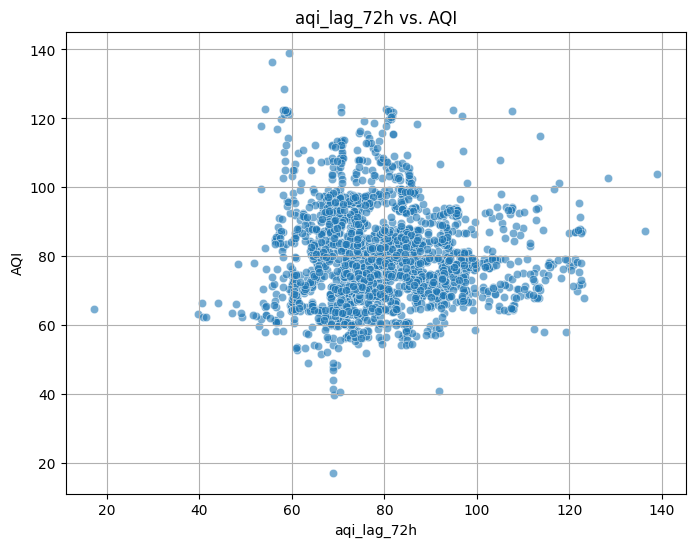

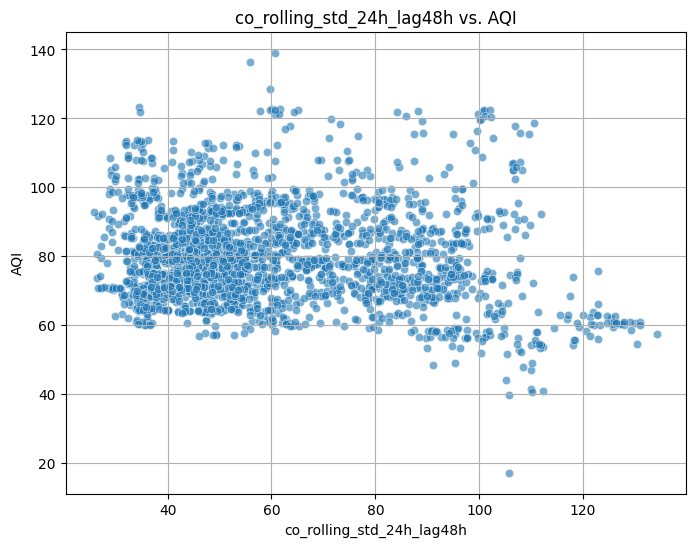

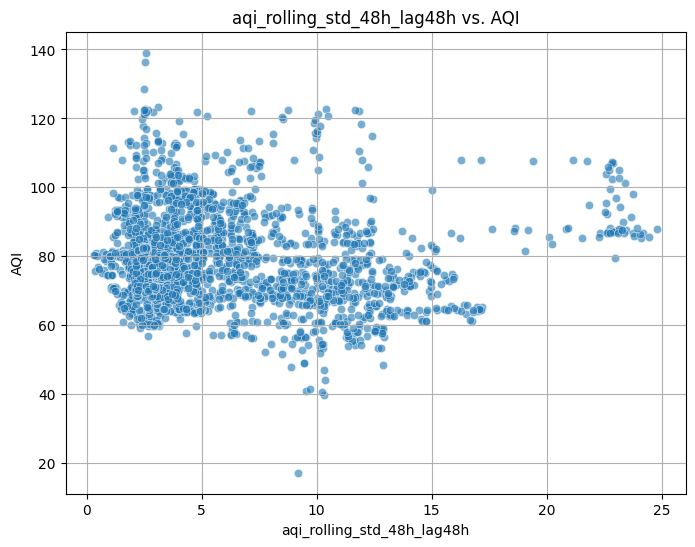

In [ ]:
for feature in valid_features_48h:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=aqi_48h_df, x=feature, y='aqi_48h', alpha=0.6)
    plt.title(f'{feature} vs. AQI')
    plt.xlabel(feature)
    plt.ylabel('AQI')
    plt.grid(True)
    plt.show()

In [ ]:
valid_features_72h = [col for col in features_72h if col in aqi_72h_df.columns]
print("Descriptive Statistics for 72h Prediction Horizon:")
display(aqi_72h_df[valid_features_72h].describe())

Descriptive Statistics for 72h Prediction Horizon:


,no2_rolling_std_24h_lag72h,aqi_lag_120h,co_rolling_std_24h_lag72h,aqi_48h,aqi_lag_96h,aqi_lag_168h,so2_rolling_std_24h_lag72h,aqi_lag_72h
count,2412.000000,2412.000000,2412.000000,2412.000000,2412.000000,2412.000000,2412.000000,2412.000000
mean,3.375818,80.151978,60.032236,79.541100,79.950645,80.903961,1.186783,79.881630
std,1.237762,13.454510,22.623535,13.210801,13.298480,14.372984,0.520011,13.281197
min,1.101715,17.160494,25.803452,17.160494,17.160494,17.160494,0.297691,17.160494
25%,2.436621,70.876209,42.823198,70.457174,70.876209,70.932539,0.800093,70.915014
50%,3.159246,78.728989,52.792839,77.995567,78.606312,78.952431,1.058972,78.466110
75%,4.067571,87.276825,77.252915,86.825552,87.033663,88.140833,1.461600,86.945601
max,7.891648,139.087112,134.322927,139.087112,139.087112,139.087112,2.941883,139.087112



Pair plot for a subset of 24h Prediction Horizon Features and Target:


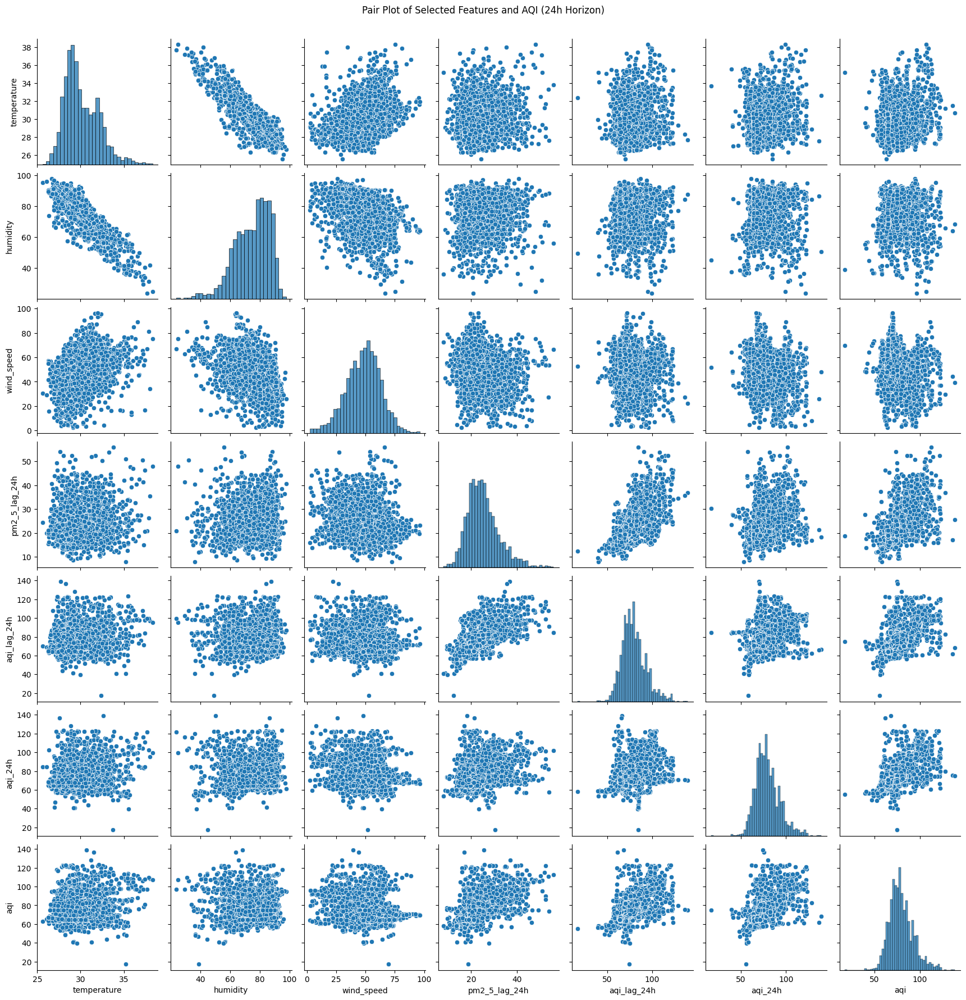

In [ ]:
subset_features_24h = [
    'temperature', 'humidity', 'wind_speed', 'pm2_5_lag_24h', 'aqi_lag_24h', 'aqi_24h', 'aqi'
]

valid_subset_features_24h = [col for col in subset_features_24h if col in aqi_24h_df.columns]

if valid_subset_features_24h:
    print("\nPair plot for a subset of 24h Prediction Horizon Features and Target:")
    sns.pairplot(aqi_24h_df[valid_subset_features_24h].dropna())
    plt.suptitle('Pair Plot of Selected Features and AQI (24h Horizon)', y=1.02)
    plt.show()
else:
    print("None of the selected subset features are in the aqi_24h_df dataframe.")


Pair plot for a subset of 48h Prediction Horizon Features and Target:


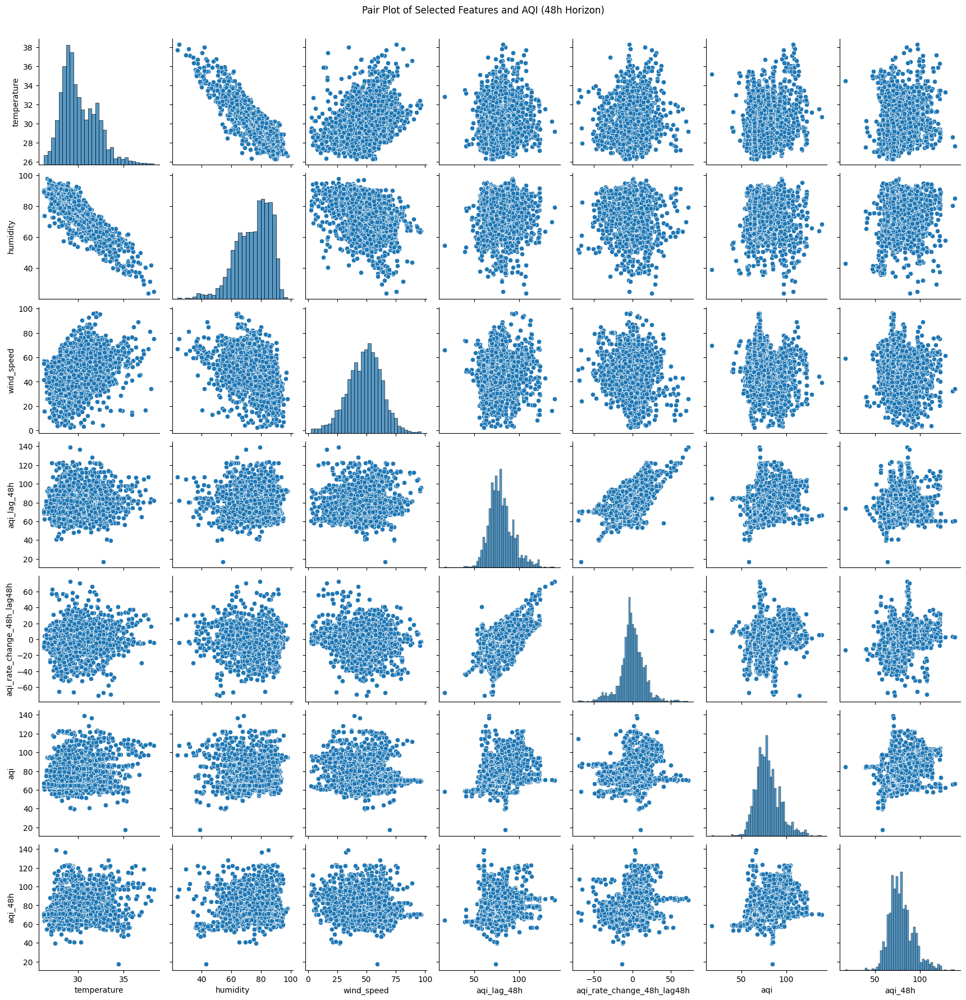

In [ ]:
subset_features_48h = [
    'temperature', 'humidity', 'wind_speed', 'aqi_lag_48h', 'aqi_rate_change_48h_lag48h', 'aqi', 'aqi_48h'
]

valid_subset_features_48h = [col for col in subset_features_48h if col in aqi_48h_df.columns]

if valid_subset_features_48h:
    print("\nPair plot for a subset of 48h Prediction Horizon Features and Target:")
    sns.pairplot(aqi_48h_df[valid_subset_features_48h].dropna())
    plt.suptitle('Pair Plot of Selected Features and AQI (48h Horizon)', y=1.02)
    plt.show()
else:
    print("None of the selected subset features are in the aqi_48h_df dataframe.")


Pair plot for a subset of 72h Prediction Horizon Features and Target:


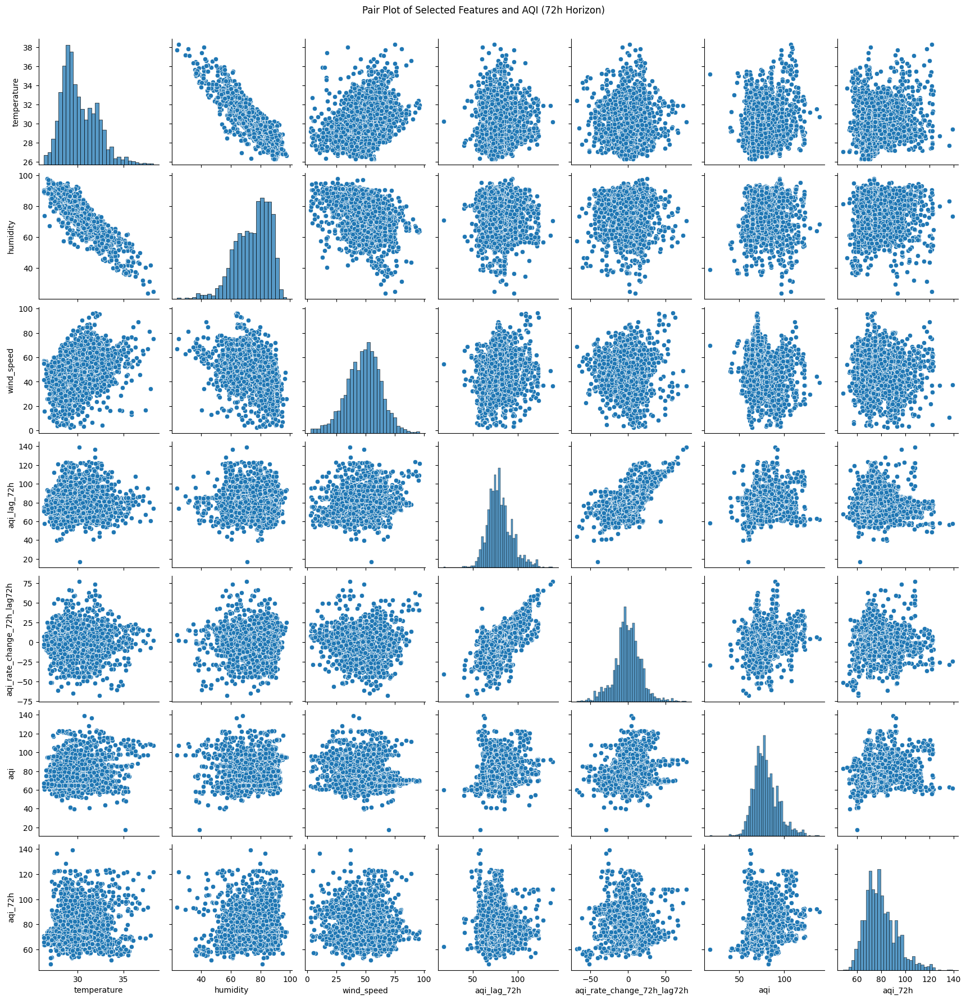

In [ ]:
subset_features_72h = [
    'temperature', 'humidity', 'wind_speed', 'aqi_lag_72h', 'aqi_rate_change_72h_lag72h', 'aqi', 'aqi_72h'
]

valid_subset_features_72h = [col for col in subset_features_72h if col in aqi_72h_df.columns]

if valid_subset_features_72h:
    print("\nPair plot for a subset of 72h Prediction Horizon Features and Target:")
    sns.pairplot(aqi_72h_df[valid_subset_features_72h].dropna())
    plt.suptitle('Pair Plot of Selected Features and AQI (72h Horizon)', y=1.02)
    plt.show()
else:
    print("None of the selected subset features are in the aqi_72h_df dataframe.")